# ECSE 415 Project
## Group 4
Amal Koodoruth (Part 1)

Matteo Nunez (Part 3)

Shaun Soobagrah (Part 2)


## Part 1

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/ECSE415/project/'

/content/drive/MyDrive/ECSE415/project


In [ ]:
import os
import numpy as np
import pandas as pd
import xml.etree.ElementTree as ET

In [ ]:
contents = os.listdir('dog_detector_project_F2022/stanford-dog-images')

In [ ]:
## forgot to sort, according to: https://mycourses2.mcgill.ca/d2l/le/592710/discussions/threads/1244776/View?filters=unread,  it is OK.
print(contents)

['n02097658-silky_terrier', 'n02092002-Scottish_deerhound', 'n02099849-Chesapeake_Bay_retriever', 'n02091244-Ibizan_hound', 'n02095314-wire-haired_fox_terrier', 'n02091831-Saluki', 'n02102318-cocker_spaniel', 'n02104365-schipperke', 'n02090622-borzoi', 'n02113023-Pembroke', 'n02105505-komondor', 'n02093256-Staffordshire_bullterrier', 'n02113799-standard_poodle', 'n02109961-Eskimo_dog', 'n02089973-English_foxhound', 'n02099601-golden_retriever', 'n02095889-Sealyham_terrier', 'n02085782-Japanese_spaniel', '.DS_Store', 'n02097047-miniature_schnauzer', 'n02110063-malamute', 'n02105162-malinois', 'n02086079-Pekinese', 'n02097130-giant_schnauzer', 'n02113978-Mexican_hairless', 'n02107142-Doberman', 'n02097209-standard_schnauzer', 'n02115913-dhole', 'n02106662-German_shepherd', 'n02106382-Bouvier_des_Flandres', 'n02110185-Siberian_husky', 'n02094258-Norwich_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02109525-Saint_Bernard', 'n02093754-Border_terrier', 'n02105251-briar

In [ ]:
indices = []
for i in range(10):
  indices.append((4+13*i)%120)

In [ ]:
print(indices) # indices that we want

[4, 17, 30, 43, 56, 69, 82, 95, 108, 1]


In [ ]:
g4_content = [contents[idx] for idx in indices]

In [ ]:
print(g4_content)

['n02095314-wire-haired_fox_terrier', 'n02085782-Japanese_spaniel', 'n02110185-Siberian_husky', 'n02095570-Lakeland_terrier', 'n02100236-German_short-haired_pointer', 'n02110958-pug', 'n02096177-cairn', 'n02088466-bloodhound', 'n02102177-Welsh_springer_spaniel', 'n02092002-Scottish_deerhound']


In [ ]:
# code from the tutorial
# Function to get the data from XML Annotation
def extract_info_from_xml(xml_file):
    root = ET.parse(xml_file).getroot()
    
    # Initialise the info dict 
    info_dict = {}
    info_dict['bboxes'] = []

    # Parse the XML Tree
    for elem in root:
        # Get the file name 
        if elem.tag == "filename":
            info_dict['filename'] = elem.text
            
        # Get the image size
        elif elem.tag == "size":
            image_size = []
            for subelem in elem:
                image_size.append(int(subelem.text))
            
            info_dict['image_size'] = tuple(image_size)
        
        # Get details of the bounding box 
        elif elem.tag == "object":
            bbox = {}
            for subelem in elem:
                if subelem.tag == "name":
                    bbox["class"] = subelem.text
                    
                elif subelem.tag == "bndbox":
                    for subsubelem in subelem:
                        bbox[subsubelem.tag] = int(subsubelem.text)            
            info_dict['bboxes'].append(bbox)
    
    return info_dict

In [ ]:
# Dictionary that maps class names to IDs
class_name_to_id_mapping = {"Scottish_deerhound": 0,
                           "Japanese_spaniel": 1,
                           "Siberian_husky": 2,
                           "Lakeland_terrier": 3,
                           "German_short-haired_pointer": 4,
                           "pug": 5,
                           "cairn": 6,
                           "bloodhound": 7,
                            "Welsh_springer_spaniel": 8,
                            "wire-haired_fox_terrier":9
                           }

# Convert the info dict to the required yolo format and write it to disk
def convert_to_yolov5(info_dict):
#     print(info_dict["filename"])
    print_buffer = []
    
    # For each bounding box
    for b in info_dict["bboxes"]:
        try:
            class_id = class_name_to_id_mapping[b["class"]]
        except KeyError:
            print("Invalid Class. Must be one from ", class_name_to_id_mapping.keys())
        
        # Transform the bbox co-ordinates as per the format required by YOLO v5
        b_center_x = (b["xmin"] + b["xmax"]) / 2 
        b_center_y = (b["ymin"] + b["ymax"]) / 2
        b_width    = (b["xmax"] - b["xmin"])
        b_height   = (b["ymax"] - b["ymin"])
        
        # Normalise the co-ordinates by the dimensions of the image
        image_w, image_h, image_c = info_dict["image_size"]  
        b_center_x /= image_w 
        b_center_y /= image_h 
        b_width    /= image_w 
        b_height   /= image_h 
        
        #Write the bbox details to the file 
        print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, b_center_x, b_center_y, b_width, b_height))
        
    # Name of the file which we have to save 
    save_file_name = os.path.join("G4/full_annotations", (info_dict["filename"]+'.txt'))
    
    # Save the annotation to disk
    print("\n".join(print_buffer), file= open(save_file_name, "w"))

In [ ]:
for file in os.listdir('G4/stanford-dogs-annotation'):
    if file != '.DS_Store':
#         os.makedirs(os.path.join('G4/annotations', file))
        file_dir = os.path.join('G4/stanford-dogs-annotation', file)
        for ann in os.listdir(file_dir):
            ann_path = os.path.join(file_dir, ann)
            info = extract_info_from_xml(ann_path)
            convert_to_yolov5(info)
       

In [ ]:
annotations = [os.path.join('G4/full_annotations', x) for x in os.listdir('G4/full_annotations') if x != '.DS_Store'] #if x[-3:] == "xml"]
annotations.sort()

In [ ]:
classes = [os.path.join('G4/stanford-dog-images', x) for x in os.listdir('G4/stanford-dog-images') if x != '.DS_Store'] #if x[-3:] == "xml"]
classes.sort()

In [ ]:
images_path = []
for cla in classes:
    for image in os.listdir(cla):
        img_path = os.path.join(cla, image)
        images_path.append(img_path)
# images_path.sort()

In [ ]:
import random 
random.seed(0)

class_id_to_name_mapping = dict(zip(class_name_to_id_mapping.values(), class_name_to_id_mapping.keys()))
# Function that plots bounding box; taken from tutorial
def plot_bounding_box(image, annotation_list):
    annotations = np.array(annotation_list)
    w, h = image.size
    
    plotted_image = ImageDraw.Draw(image)

    transformed_annotations = np.copy(annotations)
    transformed_annotations[:,[1,3]] = annotations[:,[1,3]] * w
    transformed_annotations[:,[2,4]] = annotations[:,[2,4]] * h 
#     print(transformed_annotations)
    
    transformed_annotations[:,1] = transformed_annotations[:,1] - (transformed_annotations[:,3] / 2)
    transformed_annotations[:,2] = transformed_annotations[:,2] - (transformed_annotations[:,4] / 2)
    transformed_annotations[:,3] = transformed_annotations[:,1] + transformed_annotations[:,3]
    transformed_annotations[:,4] = transformed_annotations[:,2] + transformed_annotations[:,4]
    
    for ann in transformed_annotations:
        obj_cls, x0, y0, x1, y1 = ann
        plotted_image.rectangle(((x0,y0), (x1,y1)))
        
        plotted_image.text((x0, y0 - 10), class_id_to_name_mapping[(int(obj_cls))])
    
    plt.imshow(np.array(image))
    plt.show()

In [ ]:
import PIL.Image
from PIL import Image,ImageDraw
# from IPython.display import Image
import matplotlib.pyplot as plt
import random 
random.seed(0)

In [ ]:
# EXECUTED LOCALLY AT FIRST TO CHECK ANNOTATIONS. SINCE DIRECTORIES ARE DIFFERENT ON COLAB
# AND SINCE IMAGES WERE MOVED, WE GET AN ERROR

# # Get any random annotation file 
# # annotation_file = random.choice(annotations)
# # rand_idx = random.randint(0, len(annotations))
# rand_idx = random.sample(range(0,len(annotations)), 5)
# # annotation_file = annotations[rand_idx]
# annotation_files = [annotations[i] for i in rand_idx]
# idx=0
# for annotation_file in annotation_files:


#     with open(annotation_file, "r") as file:
#         annotation_list = file.read().split("\n")[:-1]
#         annotation_list = [x.split(" ") for x in annotation_list]
#         annotation_list = [[float(y) for y in x ] for x in annotation_list]

#     #Get the corresponding image file
#     image_file = images_path[rand_idx[idx]]#annotation_file.replace("annotations", "images").replace("txt", "png")
#     # print(image_file)
#     assert os.path.exists(image_file)

#     #Load the image
#     image = Image.open(image_file)

#     #Plot the Bounding Box
#     plot_bounding_box(image, annotation_list)
#     idx+=1

IndexError: list index out of range

In [ ]:
!pip3 install -U scikit-learn
from sklearn.model_selection import train_test_split
# Split the dataset into train-valid-test splits 
train_images, val_images, train_annotations, val_annotations = train_test_split(images_path, annotations, test_size = 0.2, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
     |████████████████████████████████| 8.7 MB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 34.3 MB 11.4 MB/s eta 0:00:01
  Using cached joblib-1.2.0-py3-none-any.whl (297 kB)
  Using cached threadpoolctl-3.1.0-py3-none-any.whl (14 kB)
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/

In [ ]:
!mkdir G4/images/train G4/images/val G4/images/test G4/labels/train G4/labels/val G4/labels/test

In [ ]:
import shutil

In [ ]:
#Utility function to move images 
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# Move the splits into their folders
move_files_to_folder(train_images, 'G4/images/train')
move_files_to_folder(val_images, 'G4/images/val/')
move_files_to_folder(test_images, 'G4/images/test/')
move_files_to_folder(train_annotations, 'G4/labels/train/')
move_files_to_folder(val_annotations, 'G4/labels/val/')
move_files_to_folder(test_annotations, 'G4/labels/test/')
# !mv annotations labels
# %cd ../

/Users/amalnabeelkoodoruth/Desktop/Notes/Fall2022/ECSE415


In [ ]:
# Creating augmented dataset
import PIL
from PIL import Image

for file in os.listdir('G4/images/train'):
    im = Image.open(os.path.join('G4/images/train', file))
    out = im.transpose(PIL.Image.FLIP_LEFT_RIGHT) # flips image horizontally
    new_name = 'aug_'+file
    out.save(os.path.join('G4/images/aug_train', new_name)) # saves new image with different name so that it does not overwrite original
#     break

In [ ]:
# augmented text annotation [c, (1-x_centre), y_centre, w, h]
for annotation_file in os.listdir('G4/labels/train'):

    with open(os.path.join('G4/labels/train',annotation_file), "r") as file:
        ## create new label
        annotation_list = file.read().split("\n")[:-1]
        annotation_list = [x.split(" ") for x in annotation_list]
        annotation_list = [[float(y) for y in x ] for x in annotation_list]

        new_x = 1-annotation_list[0][1]
        new_annotation_list = annotation_list.copy()
        new_annotation_list[0][1] = round(new_x,3)
        
        ## write to file
        with open(os.path.join('G4/labels/aug_train',('aug_'+annotation_file)), "w") as f:
            for i in range(len(new_annotation_list[0])):
                if i == 0:
                    f.write('{} '.format(str(new_annotation_list[0][i])))
                elif i != 4:
                    f.write('{} '.format(str(new_annotation_list[0][i])))
                else:
                    f.write('{}\n'.format(str(new_annotation_list[0][i])))
        
        

[[6.0, 0.457, 0.544, 0.914, 0.907]]
[[6.0, 0.08599999999999997, 0.544, 0.5429999999999999, 0.907]]


Part 1 was run locally, and the train, test and val folders were uploaded to the drive later. So part 1(c) will not run in this environment (the way directories are organized). However, while running it locally, we ensured that the conversion to .txt was made correctly and that the bounding boxes were properly plotted.

To make up for this, we run it after augmenting the dataset. In fact, by doing this, we also check if the transformation and annotations are correct

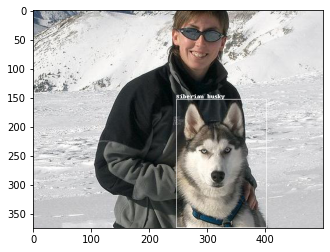

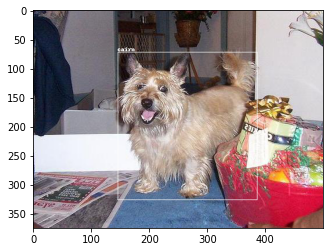

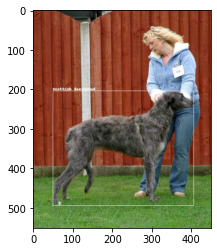

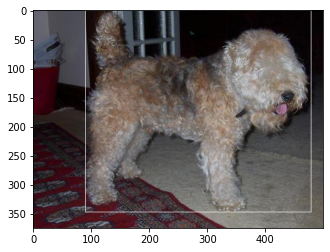

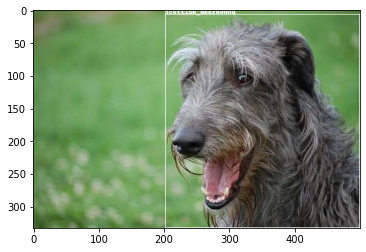

In [ ]:
## displaying annotations + checking if augmentation was ok

# aug_images_path = [os.path.join('G4/images/aug_train',x) for x in os.listdir('G4/images/aug_train')]
aug_annotations = [os.path.join('labels/aug_train',x) for x in os.listdir('labels/aug_train')]

rand_idx = random.sample(range(0,len(aug_annotations)), 5)
annotation_files = [aug_annotations[i] for i in rand_idx]

idx=0
for annotation_file in annotation_files:

    with open(annotation_file, "r") as file:
        annotation_list = file.read().split("\n")[0]
        annotation_list = annotation_list.split(" ")
        annotation_list = [[float(y) for y in annotation_list]]

    #Get the corresponding image file
    image_file = annotation_file.replace("labels", "images").replace("txt", "jpg")
    # print(image_file)
#     assert os.path.exists(image_file)

    #Load the image
    image = Image.open(image_file)

    #Plot the Bounding Box
    plot_bounding_box(image, annotation_list)
    idx+=1

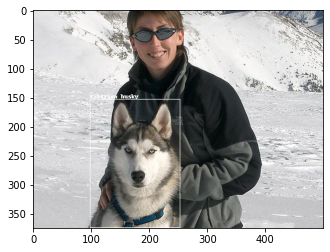

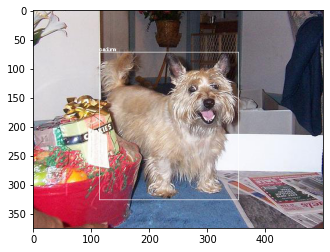

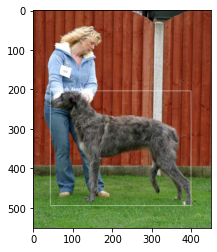

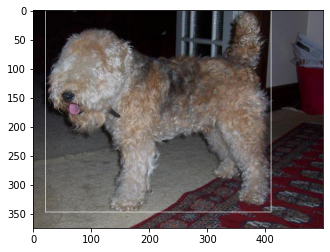

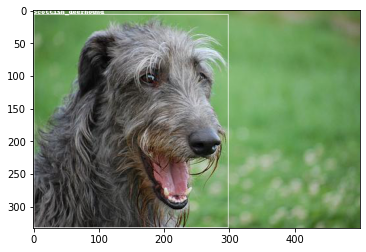

In [ ]:
# now for original
for annotation_file in annotation_files:
    annotation_file = annotation_file.replace("aug_","") # remove aug_ from the name

    with open(annotation_file, "r") as file:
        annotation_list = file.read().split("\n")[0]
        annotation_list = annotation_list.split(" ")
        annotation_list = [[float(y) for y in annotation_list]]
        

    #Get the corresponding image file
    image_file = annotation_file.replace("labels", "images").replace("txt", "jpg").replace("aug_","")
#     assert os.path.exists(image_file)
    

    #Load the image
    image = Image.open(image_file)

    #Plot the Bounding Box
    plot_bounding_box(image, annotation_list)

We see that bounding boxes are good and that augmentations were made correctly

## Part 2

**mounting drive**

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd '/content/drive/MyDrive/project/'

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project


In [ ]:
# !git clone https://github.com/WongKinYiu/yolov7.git

In [ ]:
%cd yolov7

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7


In [ ]:
!pwd

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7


In [ ]:
#!wget https://github.com/WongKinYiu/yolov7/releases/download/v0.1/yolov7.pt

Training with non-augmented dataset

In [ ]:
!python train.py --device 0 --img 500 500 --cfg cfg/training/yolov7-custom.yaml --hyp data/hyp.scratch.custom.yaml --batch-size 16 --epochs 100 --data data/custom_data.yaml --weights yolov7.pt --name yolov7-custom

YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=16, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7-custom.yaml', data='data/custom_data.yaml', device='0', entity=None, epochs=100, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.custom.yaml', image_weights=False, img_size=[500, 500], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov7-custom', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov7-custom4', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=16, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs

**Training with non augmented set result**


we can see that the average precision increases to above 90%

augmented set training

In [ ]:
!python train.py --device 0 --img 500 500 --cfg cfg/training/yolov7-custom.yaml --hyp data/hyp.scratch.custom.yaml --batch-size 8 --epochs 100 --data data/custom_data_aug.yaml --weights yolov7.pt --name yolov7-custom_aug_v2

YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, artifact_alias='latest', batch_size=8, bbox_interval=-1, bucket='', cache_images=False, cfg='cfg/training/yolov7-custom.yaml', data='data/custom_data_aug.yaml', device='0', entity=None, epochs=100, evolve=False, exist_ok=False, freeze=[0], global_rank=-1, hyp='data/hyp.scratch.custom.yaml', image_weights=False, img_size=[500, 500], label_smoothing=0.0, linear_lr=False, local_rank=-1, multi_scale=False, name='yolov7-custom_aug_v2', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov7-custom_aug_v2', save_period=-1, single_cls=False, sync_bn=False, total_batch_size=8, upload_dataset=False, v5_metric=False, weights='yolov7.pt', workers=8, world_size=1)
tensorboard: Start with 'tensorboard --logdir runs/train', view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005

**augmented set reslt**

we can see that the average precision is just below 90 which is less than the augmented set.

## Part 3

In [ ]:
import os
import random
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2

import warnings
warnings.filterwarnings('ignore')

random.seed(0)

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
project_path = '/content/drive/MyDrive/project/'

Mounted at /content/drive/


### 3.a mAP Performance

In [ ]:
# Run test.py to compute mAP
%cd /content/drive/MyDrive/project/yolov7
!python test.py --weights runs/train/yolov7-custom4/weights/best.pt --data data/custom_data.yaml --task test --name yolov7-custom

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(augment=False, batch_size=32, conf_thres=0.001, data='data/custom_data.yaml', device='', exist_ok=False, img_size=640, iou_thres=0.65, name='yolov7-custom', no_trace=False, project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='test', v5_metric=False, verbose=False, weights=['runs/train/yolov7-custom4/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

test: Scanning 'data/test/labels' images and labels... 185 found, 0 missing, 0 empty, 0 corrupted: 100% 185/185 [00:32<00:00,  5.65it/s]
test: New cache created: data/test/labels.cache
               Class      

In [ ]:
# Run detect.py on test set
%cd /content/drive/MyDrive/project/yolov7
!python detect.py --source data/test/images/ --weights runs/train/yolov7-custom4/weights/best.pt --conf 0.25 --name yolov7-custom

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='yolov7-custom', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='data/test/images/', update=False, view_img=False, weights=['runs/train/yolov7-custom4/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  retur

In [ ]:
detections_dir = project_path + 'yolov7/runs/detect/yolov7-custom2/'
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]
len(detection_images)

185

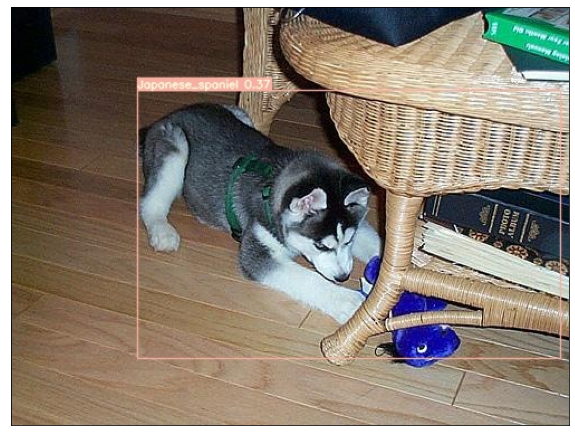

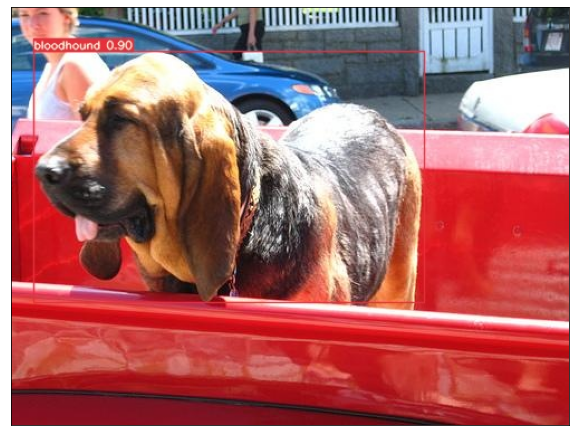

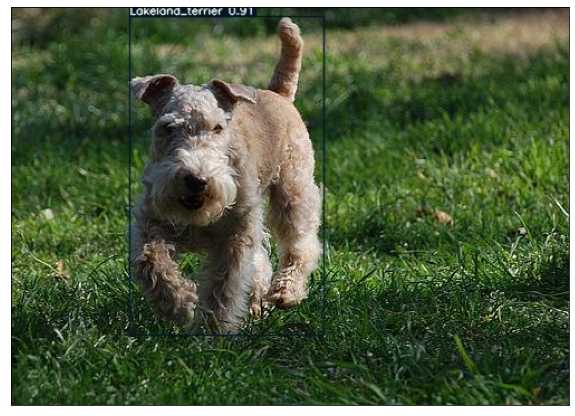

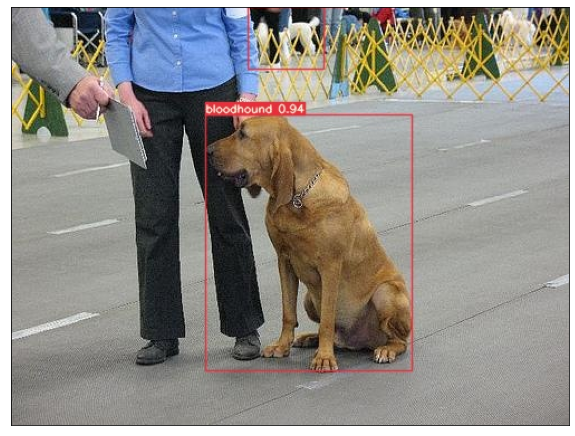

In [ ]:
random_detection_images = random.sample(detection_images, 4)
for filename in random_detection_images:
    # Get image
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot image
    plt.figure(figsize=(10,10))
    plt.imshow(img), plt.xticks([]), plt.yticks([])
    plt.show()

### 3.b mAP Performance on augmented set

In [ ]:
# Run test.py to compute mAP
%cd /content/drive/MyDrive/project/yolov7
!python test.py --weights runs/train/yolov7-custom_aug_v2/weights/best.pt --data data/custom_data_aug.yaml --task test --name yolov7-custom_aug

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(augment=False, batch_size=32, conf_thres=0.001, data='data/custom_data_aug.yaml', device='', exist_ok=False, img_size=640, iou_thres=0.65, name='yolov7-custom_aug', no_trace=False, project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='test', v5_metric=False, verbose=False, weights=['runs/train/yolov7-custom_aug_v2/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Tr

"*Does augmentation improve accuracy?*"

No. The accuracy did improved for classes (Scottish Deerhound, Siberian Husky, Japanese Spaniel, Welsh Springer Spaniel). The mAP performance metric increasef for two classes (Bloodhound, Welsh Springer Spaniel) on the augmented set trained model.

### 3.c Non-trained breeds

In [ ]:
%cd /content/drive/MyDrive/project/yolov7
!python detect.py --source ../external_data/images/non_trained_breeds/ --weights runs/train/yolov7-custom4/weights/best.pt --conf 0.25 --name yolov7-custom

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='yolov7-custom', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='../external_data/images/non_trained_breeds/', update=False, view_img=False, weights=['runs/train/yolov7-custom4/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/Tens

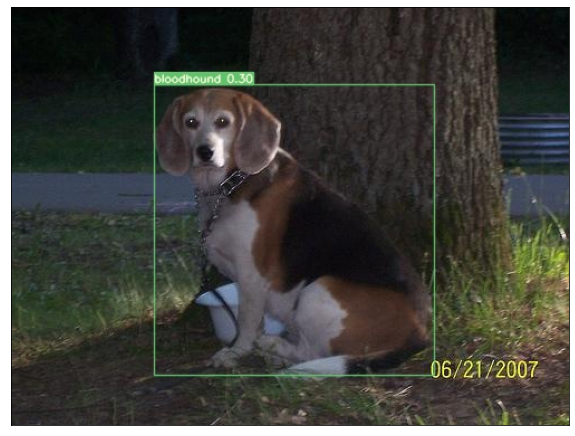

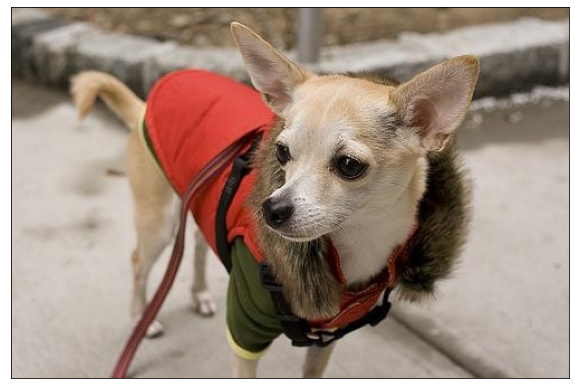

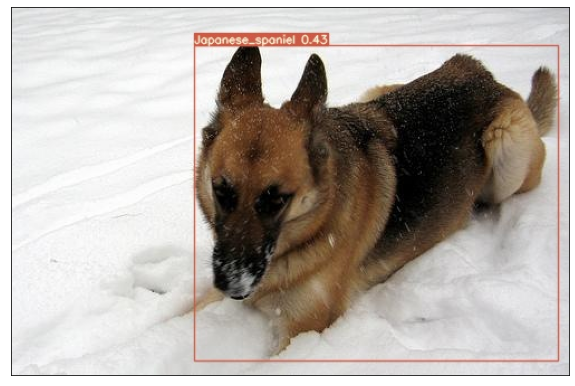

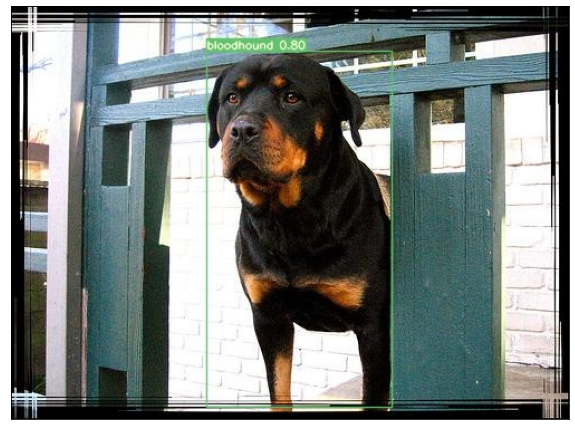

In [ ]:
detections_dir = project_path + 'yolov7/runs/detect/yolov7-custom4/'
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]
len(detection_images)

for filename in detection_images:
    # Get image
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot image
    plt.figure(figsize=(10,10))
    plt.imshow(img), plt.xticks([]), plt.yticks([])
    plt.show()

"*Do you get any detections of your 10 dog breeds in these images?*"

Yes, we do. For example, the model dectect a Beagle and a Rootweiler as Bloodhounds. While there are some similarities, it is not the correct breed.

Also, it detects a German Shepard as a Japanese Spaniel. These breeds are very distict from each other.

In one example, the model doesn't detect any dogs in the picture of a Chihuahua. It might be because the model is not trained on this breed or because the Chihuahua is wearing a vest.

### 3.d Internet dogs

In [ ]:
%cd /content/drive/MyDrive/project/yolov7
!python detect.py --source ../external_data/images/internet/ --weights runs/train/yolov7-custom4/weights/best.pt --conf 0.25 --name yolov7-custom

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='yolov7-custom', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='../external_data/images/', update=False, view_img=False, weights=['runs/train/yolov7-custom4/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CPU

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)


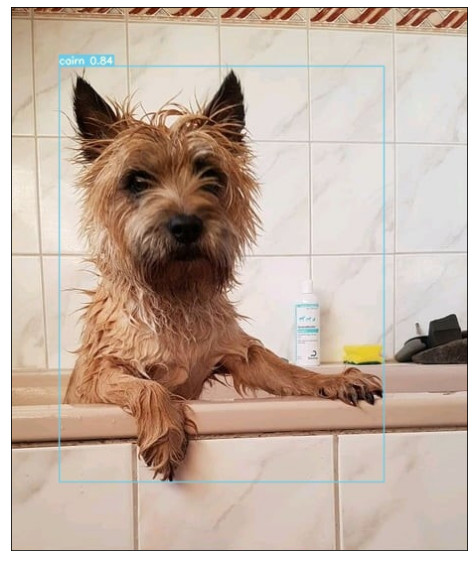

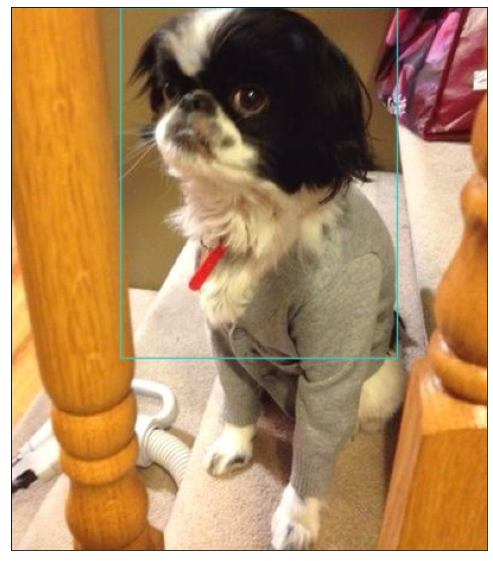

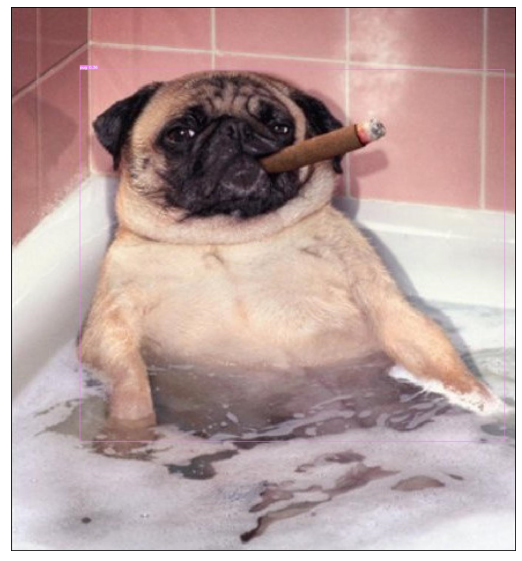

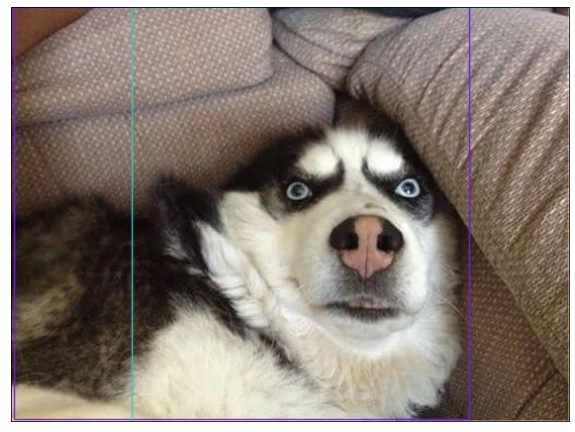

In [ ]:
detections_dir = project_path + 'yolov7/runs/detect/yolov7-custom3/'
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]
len(detection_images)

for filename in detection_images:
    # Get image
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot image
    plt.figure(figsize=(10,10))
    plt.imshow(img), plt.xticks([]), plt.yticks([])
    plt.show()

### 3.e Internet video

In [ ]:
%cd /content/drive/MyDrive/project/yolov7
!python detect.py --source ../external_data/videos/siberian_husky_temper_tantrum_360p.mp4 --weights runs/train/yolov7-custom4/weights/best.pt --conf 0.25 --name yolov7-custom

/content/drive/.shortcut-targets-by-id/1B05-nYpozs6P7RkcIjbodmiF59q_ZlDG/project/yolov7
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='yolov7-custom', no_trace=False, nosave=False, project='runs/detect', save_conf=False, save_txt=False, source='../external_data/videos/siberian_husky_temper_tantrum_360p.mp4', update=False, view_img=False, weights=['runs/train/yolov7-custom4/weights/best.pt'])
YOLOR 🚀 v0.1-115-g072f76c torch 1.12.1+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
IDetect.fuse
Model Summary: 314 layers, 36530318 parameters, 6194944 gradients
 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 

/usr/local/lib/python3.8/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggere

In [ ]:
from IPython.display import HTML
from base64 import b64encode

detections_dir = project_path + 'yolov7/runs/detect/yolov7-custom6/'
video_filename = os.path.join(detections_dir, 'siberian_husky_temper_tantrum_360p.mp4') 

def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=1000 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

play(video_filename)

*Video could not be displayed so it was included in the submission zip.*